 # fieldwork_location.png 
 
 ## Modis moa Inset map, ant in corner, icestreams scale, square of common border, include flow route,
 


## ICESat-2 detected active subglacial lakes

Making pretty maps of active subglacial lakes in Antarctica, a companion jupyter notebook to https://github.com/weiji14/deepicedrain. Uses PyGMT for illustration, heavily inspired by https://github.com/mrsiegfried/Venturelli2020-GRL


In [1]:
import os
import re

import geopandas as gpd
import numpy as np
import pandas as pd
import pooch
import pygmt
import glob
import rasterio as rio
import matplotlib.pyplot as plt
from shapely.geometry import Point

In [2]:
#study area bounds
xmin, xmax, ymin, ymax = -382700, -374781.9, -734075.1, -721770.2


## Get data files

Data for background basemaps:

- Haran, T. M., Bohlander, J., Scambos, T. A., Painter, T. H., & Fahnestock, M. A. (2014). MODIS Mosaic of Antarctica 2008-2009 (MOA2009) Image Map. U.S. Antarctic Program Data Center (USAP-DC), via National Snow and Ice Data Center (NSIDC). https://doi.org/10.7265/N5KP8037
- Depoorter, M. A., Bamber, J. L., Griggs, J. A., Lenaerts, J. T. M., Ligtenberg, S. R. M., van den Broeke, M. R., & Moholdt, G. (2013). Antarctic masks (ice-shelves, ice-sheet, and islands), link to shape file (p. 15.8 MBytes) [Application/zip]. PANGAEA - Data Publisher for Earth & Environmental Science. https://doi.org/10.1594/PANGAEA.819147
- Mouginot, J., Rignot, E., & Scheuchl, B. (2019). MEaSUREs Phase Map of Antarctic Ice Velocity, Version 1 [Data set]. NASA National Snow and Ice Data Center DAAC. https://doi.org/10.5067/PZ3NJ5RXRH10



In [3]:
datafold = '/Volumes/arc_02/REMOTE_SENSING/Quantarctica3/'

In [4]:
# Using Quantarctica3 from https://www.npolar.no/quantarctica/
# datafold: str = os.getenv("DATAHOME") or os.path.abspath("Quantarctica3")
# os.makedirs(name=datafold, exist_ok=True)

In [5]:
# MODIS Mosaic of Antarctica
# moa_no_nan: str = pooch.retrieve(
#     url="ftp://ftp.nsidc.org/pub/DATASETS/nsidc0593_moa2009/geotiff/moa750_2009_hp1_v01.1.tif.gz",
#     known_hash="90d1718ea0971795ec102482c47f308ba08ba2b88383facb9fe210877e80282c",
#     path=f"{datafold}/SatelliteImagery/MODIS",
#     processor=pooch.Decompress(name="moa750_2009_hp1_v1.1.tif"),
# )
moa_no_nan = '/Volumes/arc_02/REMOTE_SENSING/Quantarctica3/SatelliteImagery/MODIS/moa750_2009_hp1_v1.1.tif'
moa = f"{datafold}/SatelliteImagery/MODIS/moa750_2009_hp1_v01.1.tif"
try:
    assert os.path.exists(path=moa)
except AssertionError:
    with pygmt.clib.Session() as lib:
        # !gmt grdmath $moa_no_nan 0 NAN = $moa
        lib.call_module(module="grdmath", args=f"{moa_no_nan} 0 NAN = {moa}")

In [6]:
groundingline = glob.glob(f"{datafold}/Miscellaneous/ScrippsGroundingLine/*.shp")[0]

In [7]:
# # Scripps Grounding Line
# shapefiles: list = pooch.retrieve(
#     url="https://epic.awi.de/id/eprint/33781/1/Antarctica_masks.zip",
#     known_hash="e4c5918240e334680aed1329f109527efd8f43b6a277bb8e77b66f84f8c16619",
#     fname="groundingline",
#     path=f"{datafold}/Miscellaneous/ScrippsGroundingLine",
#     processor=pooch.Unzip(),
# )
# groundingline: str = [file for file in shapefiles if file.endswith(".shp")][0]

In [8]:
# MEaSUREs Phase Map of Antarctic Ice Velocity
vel_file = f"{datafold}/Glaciology/MEaSUREs_PhaseBased_Velocity/antarctic_ice_vel_phase_map_v01"
vel: str = f"{vel_file}-vmag.nc"
try:
    assert os.path.exists(vel)
except AssertionError:
    # Note, download require a .netrc file containing 'machine urs.earthdata.nasa.gov login <uid> password <password>'
    # see https://nsidc.org/support/how/how-do-i-programmatically-access-data-spatial-temporal
    try:
        # Run processing of velocity magnitude grid locally
        vel_file: str = pooch.retrieve(
            url="https://n5eil01u.ecs.nsidc.org/MEASURES/NSIDC-0754.001/1996.01.01/antarctic_ice_vel_phase_map_v01.nc",
            known_hash="fa0957618b8bd98099f4a419d7dc0e3a2c562d89e9791b4d0ed55e6017f52416",
            fname="antarctic_ice_vel_phase_map_v01.nc",
            path=f"{datafold}/Glaciology/MEaSUREs_PhaseBased_Velocity",
        )
        with pygmt.clib.Session() as lib:
            #! gmt grdmath ${vel_file}.nc?VX 2 POW ${vel_file}.nc?VY 2 POW POW 0.5 = ${vel_file}-vmag.nc
            lib.call_module(
                module="grdmath",
                args=f"{vel_file}.nc?VX 2 POW {vel_file}.nc?VY 2 POW POW 0.5 = {vel}",
            )
    except:
        # Just download pre-processed velocity magnitude grid from GitHub
        vel: str = pooch.retrieve(
            url="https://github.com/weiji14/nzasc2021/releases/download/v0.0.0/antarctic_ice_vel_phase_map_v01-vmag.nc",
            known_hash="ed6393275d8d8475c2162a838d6b9220cd529d28a2b5d674a6bf6dbda4971049",
            fname="antarctic_ice_vel_phase_map_v01-vmag.nc",
            path=f"{datafold}/Glaciology/MEaSUREs_PhaseBased_Velocity",
        )

In [9]:
flux_nonan = '/Volumes/arc_02/REMOTE_SENSING/Quantarctica3/Glaciology/Subglacial_Water_Flux/SubglacialWaterFlux_Modelled_1km.tif'

In [10]:
flux = "/Volumes/arc_02/REMOTE_SENSING/Quantarctica3/Glaciology/Subglacial_Water_Flux/SubglacialWaterFlux_Modelled_1km_cutsmallvals.tif"

In [11]:
rio.crs.CRS.from_epsg(3031)

CRS.from_epsg(3031)

In [12]:
cut = 0.08


with rio.open(flux_nonan) as image:
    extent = [image.bounds[0],image.bounds[2],image.bounds[1],image.bounds[3]]
    im = image.read(1)
    out_meta = image.profile
    out_meta['crs'] = rio.crs.CRS.from_epsg(3031)
    
    out_meta['driver']= 'GTiff' 
    
    im[im<cut] = np.nan
    
    with rio.open(
        f"/Volumes/arc_02/REMOTE_SENSING/Quantarctica3/Glaciology/Subglacial_Water_Flux/SubglacialWaterFlux_Modelled_1km_cutsmallvals.tif",
                    'w', **out_meta) as output:
        output.write(im.reshape(1,im.shape[0],im.shape[1])  )

In [13]:
# plt.imshow(im,vmin=0.00,vmax=0.6)
# plt.colorbar()
# # plt.xlim(2000,3200)
# # plt.ylim(2000,3000)

In [14]:
# im[~np.isnan(im)].shape

In [15]:
# im[~np.isnan(im)].max()

In [16]:
# im[~np.isnan(im)].min()


### Make color maps

For MOA and ice velocity and vertical elevation trend (dhdt). Scientific color maps are from http://doi.org/10.5281/zenodo.1243862


In [64]:
#colormaps https://docs.generic-mapping-tools.org/latest/cookbook/cpts.html#of-colors-and-color-legends

pygmt.makecpt(
    series=[15000, 17000, 1],
    cmap="grayC",
    continuous=True,
    output="cmap_moa.cpt",
    reverse=True,
)
#velocity cmap
with pygmt.config(COLOR_FOREGROUND="red", COLOR_BACKGROUND="white"):
    pygmt.makecpt(series=[0, 800, 1],
                  #reverse=True,
                  cmap="white,red",
                  continuous=True,
                  output="cmap_vel.cpt",
                  background='i')

    #water flux cmap
pygmt.makecpt(
    cmap="devon",
    series=[0.05, 0.654],
    reverse=True,
    continuous=True,
    output="cmap_flux.cpt",
)



makecpt [WARNING]: Without inc in -T option, -Z has no effect (ignored)



## Figure of Siple Coast


In [65]:
# We're making this a specific height
figheight = 115  # in mm

# Region in PS71 for main part of the figure
sip_xl, sip_xh, sip_yl, sip_yh = sipreg = [-800_000, 25_000, -1_000_000, -400_000]

# Calculate the figure width and map scale
figwidth = figheight * (sip_xh - sip_xl) / (sip_yh - sip_yl)
sipratio = (sip_yh - sip_yl) / (figheight / 1000)

# Make a GMT region string and projection strings in both PS71 and Lon/Lat
sipreg = [sip_xl, sip_xh, sip_yl, sip_yh]
sipproj = f"x1:{sipratio}"
sipproj_ll = f"s0/-90/-71/1:{sipratio}"

In [66]:
# Initialize figure and plot MOA as the basemap with ticks every 200 km in xy directions
fig = pygmt.Figure()
with pygmt.config(MAP_FRAME_TYPE="inside"):
    fig.basemap(
        region=sipreg, projection=sipproj, frame=["nwse", "xf200000", "yf200000"]
    )
    fig.grdimage(grid=moa, cmap="cmap_moa.cpt", nan_transparent=True)

# Plot graticules overtop, every 2° latitude and 15° longitude
with pygmt.config(
    MAP_ANNOT_OFFSET_PRIMARY="-2p",
    MAP_FRAME_TYPE="inside",
    MAP_ANNOT_OBLIQUE=0,
    FONT_ANNOT_PRIMARY="10p,grey",
    MAP_GRID_PEN_PRIMARY="grey",
    MAP_TICK_LENGTH_PRIMARY="-10p",
    MAP_TICK_PEN_PRIMARY="thinnest,grey",
    FORMAT_GEO_MAP="dddF",
    MAP_POLAR_CAP="88/90",  # less longitude graticules at >88°S
):
    fig.basemap(
        projection=sipproj_ll, region=sipreg, frame=["NSWE", "xa15g15", "ya2g2"]
    )

# Plot the grounding line in white
fig.plot(data=groundingline, region=sipreg, projection=sipproj, pen="0.15p,white")

basemap [WARNING]: For a UTM or TM projection, your region -800000/25000/-1000000/-400000 is too large to be in degrees and thus assumed to be in meters


grdimage [WARNING]: The y-coordinates and range attribute are in conflict; must rely on coordinates only


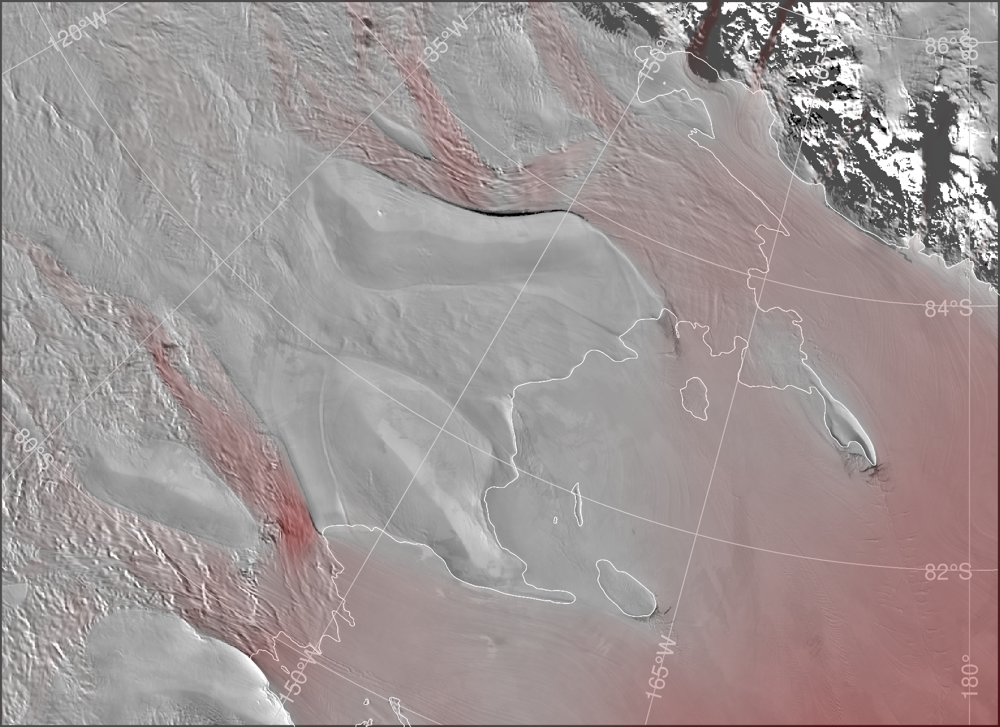

In [67]:
# Overlay ice velocity with 70% transparency
fig.grdimage(grid=vel, cmap="cmap_vel.cpt", transparency=70, nan_transparent=True)
# Overlay dhdt with 30% transparency
# pygmt.makecpt(cmap="berlin", series=[-1.0, 1.0, 0.25], continuous=True, reverse=True)
# fig.grdimage(
#     grid="ATLXI/ds_grid_dhdt_siple_coast.nc",
#     cmap=True,
#     # cmap="cmap_dhdt.cpt",
#     transparency=30,
#     nan_transparent=True,
# )
fig.show()

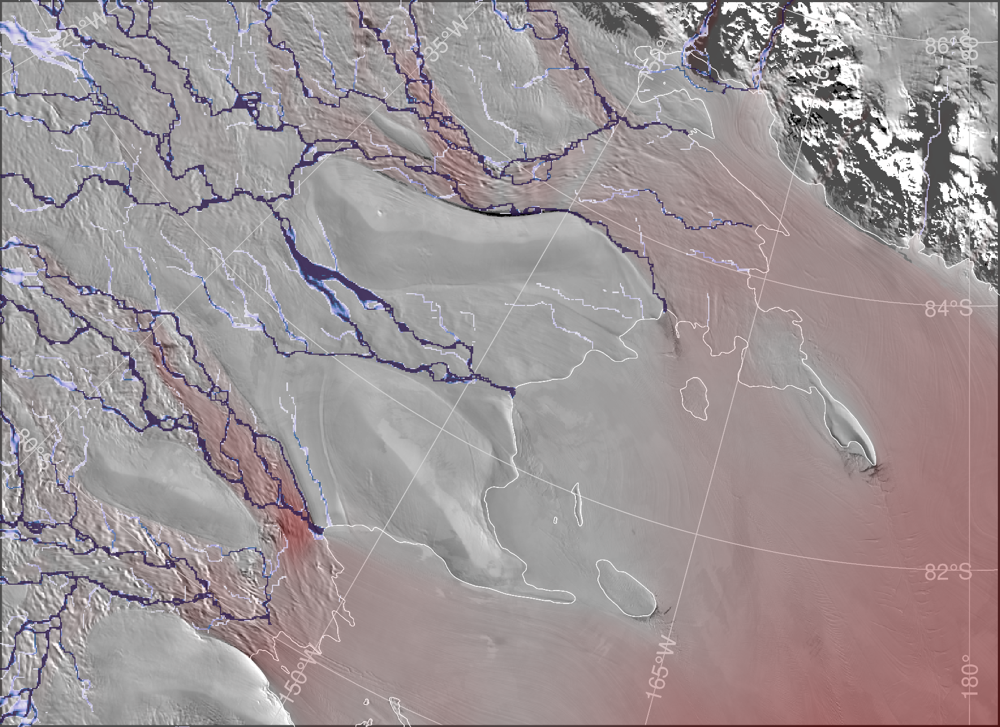

In [68]:
# Overlay subglacial water flux with 0% transparency
fig.grdimage(grid=flux, cmap='cmap_flux.cpt',
             transparency=20,  
             nan_transparent=True)
# Overlay dhdt with 30% transparency
# pygmt.makecpt(cmap="berlin", series=[-1.0, 1.0, 0.25], continuous=True, reverse=True)
# fig.grdimage(
#     grid="ATLXI/ds_grid_dhdt_siple_coast.nc",
#     cmap=True,
#     # cmap="cmap_dhdt.cpt",
#     transparency=30,
#     nan_transparent=True,
# )



fig.show()

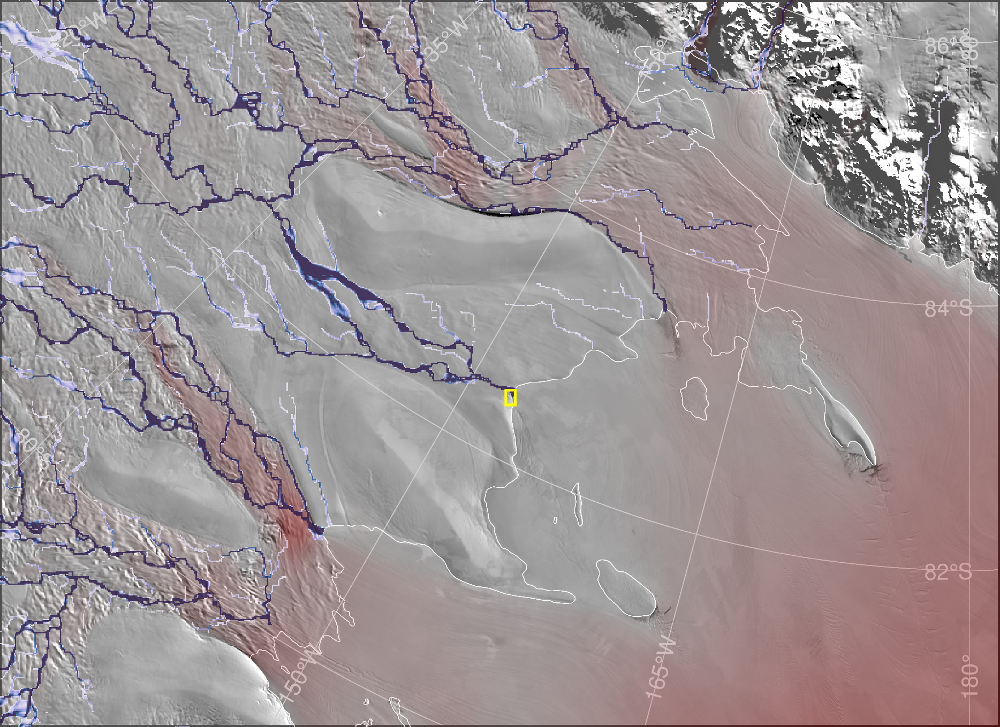

In [69]:
# Plot bounding box of KIS2 study area
fig.plot(
    x=[xmin, xmin, xmax, xmax, xmin],
    y=[ymin, ymax, ymax, ymin, ymin],
    pen="1p,yellow",  # map location in black
    #transparency=0,
)
fig.show()

In [70]:
# Siple Coast placename labels
# gdf = gpd.read_file("antarctic_subglacial_lakes_3031.gmt")
with open("place_labels_siple_coast.tsv", mode="w") as file:
    # Ice Streams A to E
    font = "12p,Helvetica-Narrow-Oblique,white"
    print(f"-200000\t-780000\t15\t{font}\tCM\tRoss Ice Shelf", file=file)
    print(f"-385000\t-555000\t-5\t{font}\tCM\tWhillans Ice Stream", file=file)
   # print(f"-470000\t-450000\t-55\t{font}\tCM\tVan der Veen Ice Stream", file=file)
    print(f"-565000\t-625000\t-30\t{font}\tCM\tKamb Ice Stream", file=file)
   # print(f"-700000\t-700000\t-45\t{font}\tCM\tBindschadler Ice Stream", file=file)
   # print(f"-700000\t-850000\t-37\t{font}\tCM\tMacAyeal Ice Stream", file=file)

    print(f"-450000\t-780000\t-35\t{font}\tCM\tSiple Dome", file=file)
    #print(f"-650000\t-800000\t-25\t{font}\tCM\tShabtaie Ice Ridge", file=file)
    #print(f"-650000\t-950000\t-15\t{font}\tCM\tHarrison Ice Ridge", file=file)

    # Abbreviated lakes
    abbrev_dict: dict = {
        "Subglacial": "S",
        "Lake": "L",
        "Conway": "C",
        "Engelhardt": "E",
        "Kamb": "K",
        "MacAyeal": "Mac",
        "Mercer": "M",
        # "Recovery", "R",
        # "Slessor","S"
        "Whillans": "W",
    }
    pattern = re.compile(pattern=rf"\b({'|'.join(abbrev_dict.keys())})\b")

#     for idx, row in gdf.dissolve(by="lake_name", as_index=False).iterrows():
#         x, y = row.geometry.centroid.xy

#         label = pattern.sub(
#             repl=lambda name: abbrev_dict[name.group()], string=row.lake_name
#         ).replace(" ", "")
#         justify = (
#             "BL"
#             if label in ("L12", "L78", "SLW", "W7", "WX", "WXI")
#             else "TC"
#             if ("*" in label or label == "SLM")
#             else "TR"
#         )

#         print(f"{x[0]:.0f}\t{y[0]:.0f}\t0\t6p,white\t{justify}\t{label}", file=file)

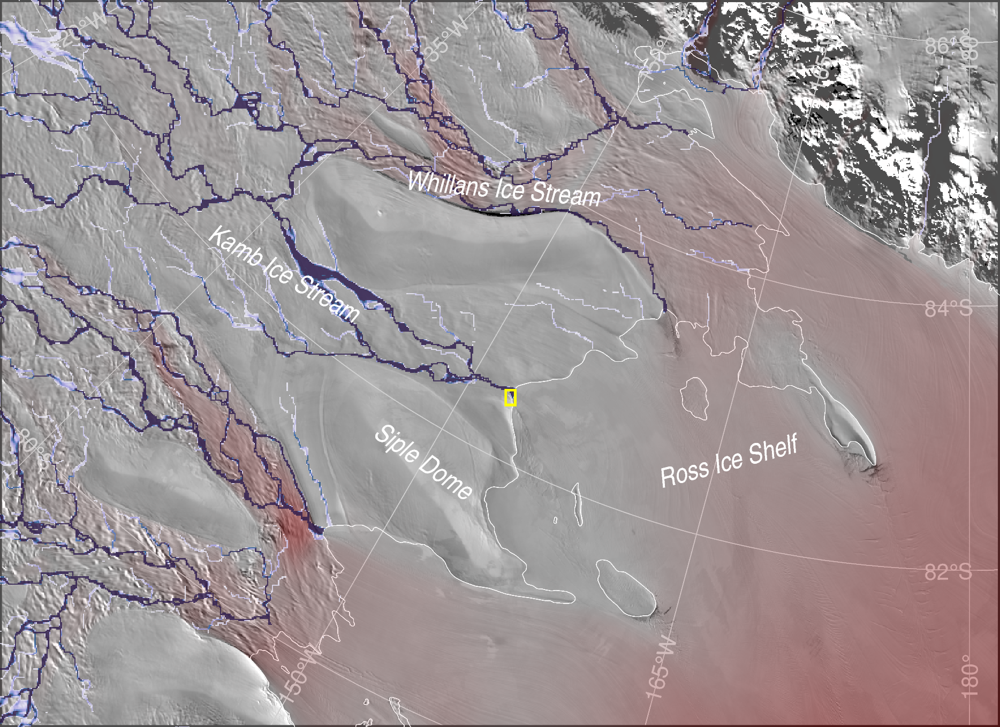

In [71]:


# Plot labels for Siple Coast ice streams, active subglacial lakes, etc
fig.text(
    textfiles="place_labels_siple_coast.tsv",
    angle=True,
    font=True,
    justify=True,
    offset="j0.12c",
    # frame=["WsNe", "af10000g50000"],
)
fig.show()



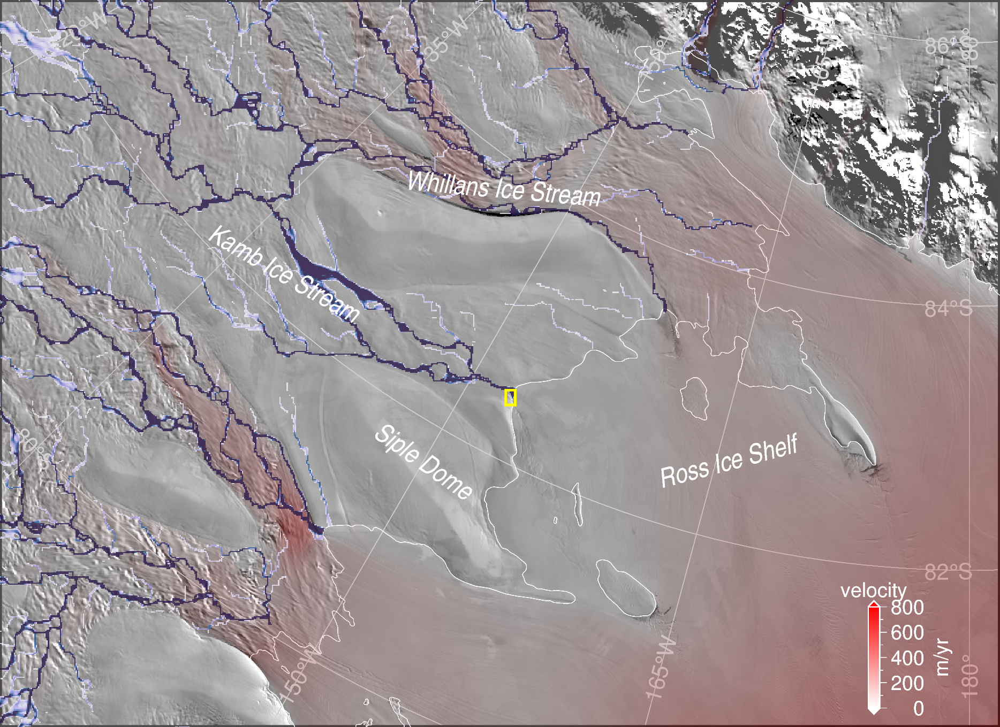

In [72]:
# Plot the velocity color bar once with a transparent box, then again with no box and no transparency
with pygmt.config(
    FONT_ANNOT_PRIMARY="9p,white",
    FONT_LABEL="9p,white",
    MAP_ANNOT_OFFSET_PRIMARY="2p",
    MAP_TICK_PEN_PRIMARY="0.25p,white",
    MAP_TICK_LENGTH_PRIMARY="3p",
    MAP_FRAME_PEN="0.5p,white",
    MAP_LABEL_OFFSET="4p",
):
    colorbar_kwargs = dict(
        cmap="cmap_vel.cpt",
        position="jBR+jBR+w1.6c/0.18c+o1.9c/0.3c+v+e",
        frame=["xaf+lm/yr", 'y+l"velocity"'],
    )
    fig.colorbar(
        #box="+gblack+c-9p/3p",
        transparency=70,
        **colorbar_kwargs,
    )
    fig.colorbar(**colorbar_kwargs)

#     # Add a scalebar
#     fig.basemap(
#         projection=sipproj_ll, region=sipreg, map_scale="jBR+o4.2c/0.3c+w50k+uk+f+c-83"
#     )

fig.show()

basemap [WARNING]: For a UTM or TM projection, your region -800000/25000/-1000000/-400000 is too large to be in degrees and thus assumed to be in meters


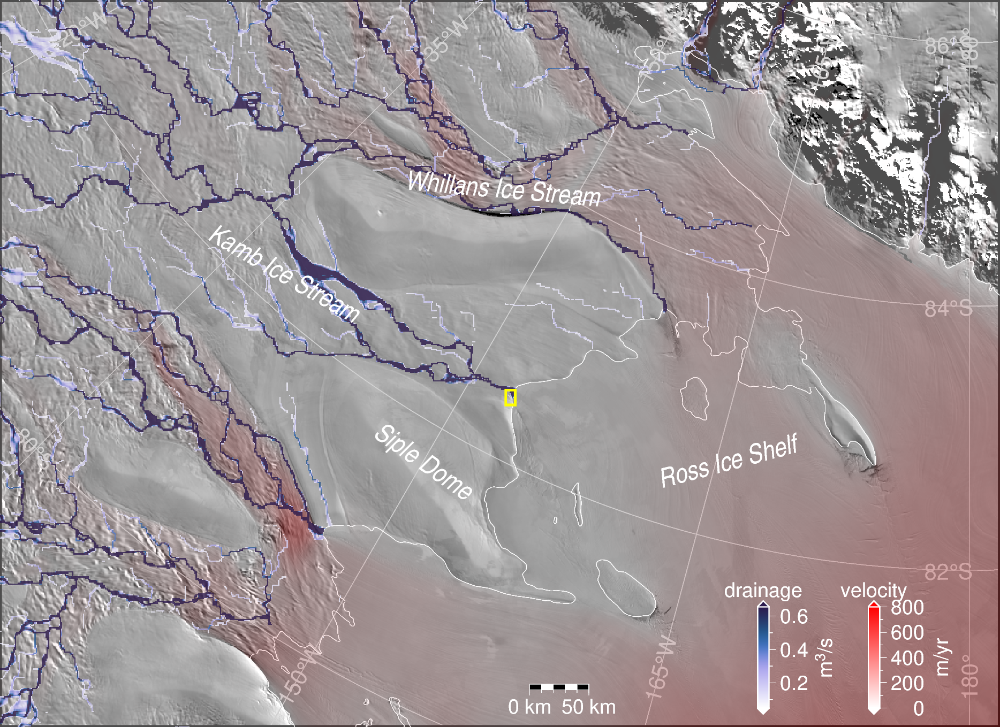

In [73]:
# Plot the drainage color bar once with a transparent box, then again with no box and no transparency
with pygmt.config(
    FONT_ANNOT_PRIMARY="9p,white",
    FONT_LABEL="9p,white",
    MAP_ANNOT_OFFSET_PRIMARY="2p",
    MAP_TICK_PEN_PRIMARY="0.25p,white",
    MAP_TICK_LENGTH_PRIMARY="3p",
    MAP_FRAME_PEN="0.5p,white",
    MAP_LABEL_OFFSET="4p",
):
    colorbar_kwargs = dict(
        cmap="cmap_flux.cpt",
        position="jBR+jBR+w1.6c/0.18c+o3.65c/0.3c+v+e", #BR bottom right
        frame=["xaf+lm@+3@+/s", 'y+l"drainage"'],
    )
    fig.colorbar(
        #box="+gblack+c-9p/3p",
        transparency=70,
        **colorbar_kwargs,
    )
    fig.colorbar(**colorbar_kwargs)

    # Add a scalebar
    fig.basemap(
        projection=sipproj_ll, region=sipreg, map_scale="jBR+o6.5c/0.5c+w50k+uk+f+c-83"
    )

fig.show()

inset [WARNING]: For a UTM or TM projection, your region -800000/25000/-1000000/-400000 is too large to be in degrees and thus assumed to be in meters
basemap [WARNING]: The y-coordinates and range attribute are in conflict; must rely on coordinates only
coast [WARNING]: The y-coordinates and range attribute are in conflict; must rely on coordinates only
coast [WARNING]: The y-coordinates and range attribute are in conflict; must rely on coordinates only
plot [WARNING]: The y-coordinates and range attribute are in conflict; must rely on coordinates only


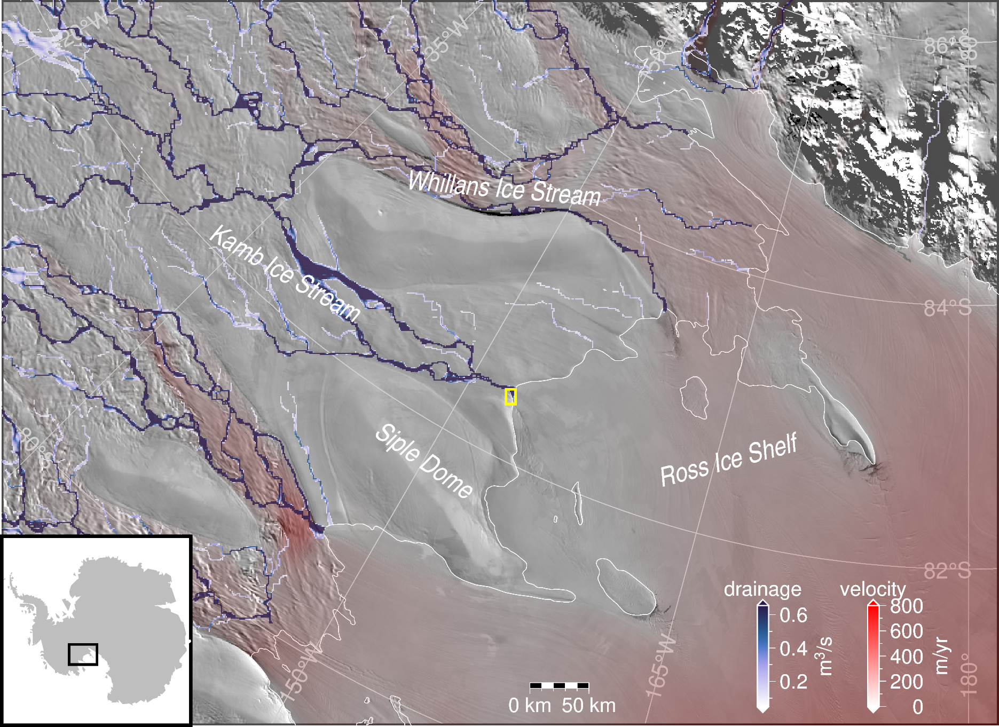

In [74]:
# Make insets of Antarctica
antwidth = 3  # width of inset in cm
with fig.inset(position=f"jBL+w{antwidth}c", box="+pblack+gwhite"):
    # Plot the inset map
    fig.basemap(region=vel, projection=f"S0/-90/71/{antwidth}c", frame="+n")
    fig.coast(area_thresh="+a", land="white")  # ice shelf in white
    fig.coast(area_thresh="+ag", land="gray")  # grounded ice in gray
    fig.plot(
        projection=f"X{antwidth}c",
        x=[sip_xl, sip_xl, sip_xh, sip_xh, sip_xl],
        y=[sip_yl, sip_yh, sip_yh, sip_yl, sip_yl],
        pen="1p,black",  # map location in black
    )

fig.show()

In [75]:
# Save the figure
fig.savefig(fname="/Users/home/whitefar/ASSIGNMENTS-PUBLICATIONS-TALKS/channel_data_writeup/PLOTS/fieldwork_location_small.png", dpi=520)